Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала была поставлена задача подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Мы проведем пошаговое исследование данных и предоставим заключительные выводы.

# ШАГ 1 Изучение общей информации

Загрузим данные о заведениях общественного питания Москвы.

Изучите общую информацию о датасете. Проведем предварительный анализ полученных данных.

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Здорово, когда есть вступление в сам проект, каждый сможет быстрее разобраться в концепции / деталях работы. 

</div>

In [1]:
# Загрузим необходимые библиотеки 
# (постараемся все перенести в один блок, но! заранее извиняемся, если по ходу исследования будем импортированть нужные и упустим момент переноса команды в начало)

import pandas as pd 
import numpy as np
import datetime as dt
import seaborn as sns
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster


In [2]:
# Загрузим файл, изучим общую информацию

data = pd.read_csv('/datasets/moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Описание данных.

Файл moscow_places.csv представлен в 14 столбцах и 8406 строках. Наименование столбцов соответсвуют стандарному написанию, изменения вносить нет необходимости.

Значения представлены типами float64, int64, object. На данном этапе логичным кажется изменить тип данных у столбца chain на bool, но пока не очевидно, что это нам пригодится. Поэтому оставим без изменений.  

Значения столбцов:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.



In [3]:
# Посмотрим на содержание 

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


# ШАГ 2 Предобработка данных

Изучим, есть ли дубликаты в данных. 

Изучим пропуски.

Выполним предобработку данных:

Создадим столбец street с названиями улиц из столбца с адресом.

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [4]:
# Посмотрим на количество пропусков данных

data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

Рекомендую также оценивать доли пропусков по столбцам, таким образом мы сразу сможем понять где больше всего пропусков в нашем датафрейме.

</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Спасибо. Для этого достаточно прописать доли в кратком выводе или необходимо подтвердить расчет кодом?</div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Лучше всего конечно расчетом 😊    
    
</div>

Имеем пропуски в столбцах:

- hours - самостоятельно заполнить график работы заведения мы не можем. Доля пропущенных данных составляет чуть более 6%. На мой вгляд, для изучения нашего вопроса достаточно будет предоставленной информации и отправлять на уточнение точно не следует. Попробуем обьединить и выделить данные по графику работы на два вида: круглосуточно работает заведение или нет. Это будет более информативно для нашего исследования. 

- price, avg_bill, middle_avg_bill, middle_coffee_cup, seats - более половины данных отсутсвует. В долевом отношении: 60%, 54%, 63%, 94%, 43%,  соответственно, - это уже существенный пробел в данных. Однозначно верно мы не может проставить верные значения сами. Оставляем на данный момент без изменений. 

Приведем наши данные к нижнему регистру, возможно, это поможет при выявлении дубликатов.


In [5]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

Однотипные расчеты мы также можем выполнять с помощью цикла `for` и тем самым оптимизировать код внутри проекта.

</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Приведение к нижнему регистру прописано через цикл for:.</div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

👍  
    
</div>

In [6]:
data_lower = (data['name'], data['address'], data['avg_bill'])

for q in data_lower:
    q = q.str.lower()
    print(data.head(20))


                    name         category  ... chain  seats
0                 wowфли             кафе  ...     0    NaN
1         четыре комнаты         ресторан  ...     0    4.0
2                  хазри             кафе  ...     0   45.0
3   dormouse coffee shop          кофейня  ...     0    NaN
4              иль марко         пиццерия  ...     1  148.0
5           sergio pizza         пиццерия  ...     0    NaN
6            огни города          бар,паб  ...     0   45.0
7             mr. уголёк  быстрое питание  ...     0   45.0
8            donna maria         ресторан  ...     0   79.0
9                 готика             кафе  ...     0   65.0
10        great room bar          бар,паб  ...     0  102.0
11           шашлык шефф             кафе  ...     0    NaN
12              заправка             кафе  ...     0    NaN
13               буханка         булочная  ...     1  180.0
14              у сильвы          бар,паб  ...     0    NaN
15             дом обеда         столова

In [7]:
# Проверим на наличие явных дубликатов

print('Наличие явных дубликатов:', data.duplicated().sum())

Наличие явных дубликатов: 0


In [8]:
# Проверим на наличие неявных дубликатов по наименованию заведения и адресу

data.duplicated(subset=['name', 'address']).sum()

4

Получили 4 совпадения. Удалим эти дубликаты.

In [9]:
# Удаляем строки с совпадениями по наименованию заведения и адресу

data = data.drop_duplicates(subset=['name', 'address'])

In [10]:
# Посмотрим описательную статистику для числовых столбцов

data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8402.000000,8402.000000,8402.000000,3149.000000,535.000000,8402.000000,4792.000000
mean,55.750080,37.608613,4.230017,958.053668,174.721495,0.381219,108.361436
std,0.069654,0.098585,0.470320,1009.732845,88.951103,0.485715,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.704950,37.538653,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753401,37.605263,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795017,37.664819,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Из этих данных мы видим, что существуют заведения с 0 посадочных мест и с 1288. Изучим этот вопрос, реально ли подобное.


In [11]:
# Изучим данные ресторанов с 0 значение посадочных мест

data1 = data[data['seats'] == data['seats'].min()]
print('Число заведений с 0 значением посадочных мест:', len(data1))
data1.head(20)


Число заведений с 0 значением посадочных мест: 136


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,meat doner kebab,булочная,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,средний счёт:300 ₽,300.0,NaN,0,0.0
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,донер-шашлык,ресторан,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,тандыр № 1,кафе,"москва, улица лескова, 22г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,неаполитан пицца,кафе,"москва, улица пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
266,пекарня&донер,булочная,"москва, широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0
284,центр плов,кафе,"москва, широкая улица, 16а",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0
290,шаурма,кафе,"москва, осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0
306,everest coffee,кофейня,"москва, сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.847770,37.440586,4.9,средние,цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0
337,пекарня маковка,пиццерия,"москва, сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0


Наименовани и типы ресторанов с 0 значением посадочных мест различны.Всего у нас таких 136 заведений. Однозначного типа нет. Могу предположить, что это не только "уличная" еда, где изначально и не предполагается наличие столов/стульев, но и варианты заведений со спецификой работы только через доставку. У нас в данных нет такого отдельного столбца с пометкой "только на доставку", поэтому допускаем, что значение 0 в столбце seats это именно такой вариант. 

In [12]:
# Изучим данные заведений с максимальным количеством посадочных мест

data2 = data[data['seats'] == data['seats'].max()]
print('Число заведений с MAX значением посадочных мест:', len(data2))
data2.head(20)


Число заведений с MAX значением посадочных мест: 11


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,средний счёт:700 ₽,700.0,NaN,0,1288.0
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0
6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0


Видим, что из всего количество ресторанов, 11 заведений заявляют максимальное число посадочных мест на 1288 клиентов. Это порядка 322 стола на 4-х гостей. Огромные заведения. Допускаем наличие таких маштабов в г.Москве и, как видим, ошибочно заявленных заведений быстрого питания, в них нет.

In [13]:
# Посмотрим количество сетевых (1) или нет (0) заведений:

print('Количество сетевых (1) и нет (0) заведений:')
data['chain'].value_counts()

Количество сетевых (1) и нет (0) заведений:


0    5199
1    3203
Name: chain, dtype: int64

Из всего общего количества пердставленных нам заведений, большая часть (5199 заведений) принадлежит к несетевым, а 3203 заведения сетевые.

In [14]:
# Посмотрим варианты категорий заведений:

data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Категории заведений представлены в 8 видах. Наименования не дублируют друг друга. 




In [15]:
# Создадим столбец street

data['street'] = data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [16]:
# Создадим столбец is_24/7

data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Хорошие способы разметить и извлечь данные внутри датасета. 
    
</div>

In [17]:
# Посмотрим, какие округа представлены 

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Как видим, представлены 9 округов. Опечаток, порождающих неявные дубликатов, нет. 

In [18]:
# Постотрим, как распределились заведения по округам

data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

С преимущественным отрывом, 2242 заведения находятся в Центральном Административном округе. Далее следуют Северный и Южный административыне округи, 898 и 892 заведений соответственно. И почти без отрыва от них, Северо-Восточный административный округ (890 заведений). 

Преимущество Центрального Административного округа очевидно в силу туристического интереса и потока людей, насыщенности офисных бизнес-центров.В округе расположено много театров, 6 московских вокзалов — Белорусский, Ленинградский, Ярославский, Казанский, Курский, Павелецкий, большинство министерств Российской Федерации, а также Кремль, Правительство РФ, Государственная дума, Совет Федерации. Значительную часть территории округа занимают различные офисные здания, на западной окраине округа в том числе расположен ММДЦ «Москва-Сити». 

Северный административный округ представляет собой 17 районов: Аэропорт, Беговой, Бескудниково, Бусиново, Войковский, Восточное Дегунино, Головинский, Дмитровский, Западное Дегунино, Коптево, Левобережный, Савеловский, Сокол, Тимирязевский, Ховрино, Хорошевский и Молжаниновский (расположен за пределами МКАД). В округ входят исторические местности: Всехсвятское, Михалково, Петровско-Разумовское, Коровино и др. Половина раайонов представляют собой элитные жилые кварталы. При этом в округе находятся железнодорожные пути Белорусского вокзала и Савеловского. Так же проходит линия большой обустроенной парковой зоны Северного речного порта. 

В СВАО много благоустроенных парков, прудов, небольших рек. Округ делится на 17 районов:Алексеевский, Алтуфьевский,Бабушкинский, Бибирево, Бутырский, Лианозово, Лосиноостровский, Марфино, Марьина Роща, Останкинский, Отрадное, Ростокино, Свиблово, Северное Медведково, Северный, Южное Медведково, Ярославский. Помимо плотной жилой застройки, в округе обустроеная парковая линия Москвы-реки и ее канала. 

Южный административный округ включает в себя 16 районов и является крупнейшим по населению округом города. Помимо большой застройки "спальных" районов, в округе находится большое количество достопримечательностей города: Царицинский парк, ансамбль историко-архитектурных памятников XVI—XIX веков "Донской монастырь", одно из древнейших мест Москвы — музей-заповедник «Коломенское»; историко-архитектурный ансамбль XVI—XVIII веков «Симонов монастырь».

В отличие от СВАО с его "роскошными" жилыми комплексами и бизнес-центрами, ЮАО сочетал в себе исторические обьекты и "спальные" районы.

Как видим, ЦАО главный претендент на успешное функционирование любого типа заведения. Но не станем оставлять без внимания и остальные округа из "тройки лидеров".




# ИТАК

на втором шаге нашего исследования мы установили, что:

- явных дубликатов в данных нет;

- по наименованию завдения и адресу нами обнаружено 4 дубликата, которые мы удалили из дальнейшего исследования;

- в данных есть пропуски, которые мы самостоятельно не в силах проставить. Поэтому данные оставляем без изменений;

- изучили типы ресторанов и подробнее рассмотрели с 0 значением посадочных мест  и с максимально заявленным 1288 посадочных мест. Всего с 0 значением 136 заведений. Однозначного типа нет. Предположили, что это не только "уличная" еда, где изначально и не предполагается наличие столов/стульев, но и варианты заведений со спецификой работы только через доставку. А заведения с максимальным количеством посадочных мест находятся все на проспекте Вернадского. Это одна из главных "артерий" города и на нем располагаются НИИ, учебные заведения и государственные структуры. Допустили, что с таким огромным количеством посадочных мест могут быть окрыты заведения непосредственно для сотрудников/учащихся этих учреждений;

- просмотрели категории заведений и увидели, что они представлены в 8 видах. Наименования не дублируют друг друга;

- создали столбец street с наименованиями улиц;

- создали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно;

- в данных нам представлены заведения из 9 административных округов. Наименования без опечаток, в исправлениях не было необходимости. С преимущественным отрывом, 2242 заведения находятся в Центральном Административном округе. Далее следуют Северный и Южный административыне округи, 898 и 892 заведений соответственно. И почти без отрыва от них, Северо-Восточный административный округ (890 заведений). 

На этапе предобработки данных мы получили первые наблюдения:

- категории заведений дали повод для размышлений: совершать нам инвестирование в "тройку" категорий, как восстребованных, ибо спрос рождает предложения, либо рассматривать варианты остальных категорий, как свободное и не перенасыщенное предложениями пространство для бизнеса;

- данные по концентрации заведений в округах показали, что большее количество заведений открыты в ЦАО и хотелось бы инвестировать в заранее успешное заведение, опираясь на визуальный опыт других. Но и следующих за "лидером" САО, СВАО, и ЮАО мы не оставим в стороне нашего исследования. 

# ШАГ 3 АНАЛИЗ ДАННЫХ

На третьем шаге нашего исследования нам предстоит ответить на следующие пункты:

1. Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

2. Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

3. Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

4. Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

5. Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

6. Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

7. Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

8. Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

9. Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

10. Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

11. Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

12. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

Соберем все наблюдения по вопросам выше в один общий вывод.

In [19]:
# категории и количество объектов по категория

category = data['category'].value_counts().reset_index()
category.columns = ['category', 'quantity']
category

,category,quantity
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [20]:
# добавим столбец %% отношения к общему количеству заведений

category['%'] = (100 * category['quantity'] / 8406).round(2)
category

,category,quantity,%
0,кафе,2376,28.27
1,ресторан,2042,24.29
2,кофейня,1413,16.81
3,"бар,паб",764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


In [21]:
# Построим график типов объектов 

fig = px.bar(category, x='category', y='quantity', text = '%', title = 'Количество заведений общественного питания по категориям')
fig.update_layout(xaxis_title = 'Категории заведений', yaxis_title = 'Количество заведений')
fig.show()

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Отличный и наглядный график 👍
    
Здорово, когда он подписан. Так быстрее понять о чем идёт речь на нём.
    
</div>

Большая часть заведений (2376) представляют собой кафе 28,27%. На втором месте по количеству идут рестораны (2042 заведения) и тройку "лидеров" завершают кофейни, 1413 заведений. "Лидеры" заняли 5831 заведение, что более половины от всех предоставленных нам заведений (69,37%). Оставшиеся 2575 заведений разденены на 5 категорий с существенно меньшим количеством в каждой: паб/бар 764 заведения, пиццерии - 633, быстрое питание - 603, столовых - 315, булочных - 256.

Эта информация нам дает повод для размышлений: совершать нам инвестирование в "тройку" категорий, как восстребованных, ибо спрос рождает предложения, либо рассматривать варианты остальных категорий, как свободное и не перенасыщенное предложениями пространство для бизнеса.

In [22]:
# количество посадочных мест по категориям

seats =data.groupby('category')['seats'].sum().reset_index().sort_values(by='seats', ascending=False)
seats.columns = ['category', 'seats']
seats

,category,seats
6,ресторан,154681.0
3,кафе,118494.0
4,кофейня,83511.0
0,"бар,паб",58131.0
5,пиццерия,40350.0
2,быстрое питание,34513.0
7,столовая,16359.0
1,булочная,13229.0


По общему количеству больше всего посадочных меств в городе у ресторанов (154681 клиентов на весь город). Далее у кафе - 118494 клиента, кофейни - 83511 гостя, бар/паб - 58131, пиццерии - 40350, заведения быстрого питания - 34313, столовые - 16359, булочные - 13229.

Рестораны, конечно же, открывают с перспективой для больших торжеств и большего количества гостей одновременно, поэтому они и сместили "лидерство" кафе с максимальным количеством заведений в этой группировке. 

In [23]:
data.pivot_table(index='category', values='seats', aggfunc='mean').round()

,seats
category,
"бар,паб",124.0
булочная,89.0
быстрое питание,99.0
кафе,97.0
кофейня,111.0
пиццерия,94.0
ресторан,122.0
столовая,100.0


Средняя величина показывает нам другую градацию заведений по количеству посадочных мест, чем от их общего числа. Здесь больше всего, 124 клиента, могут принять одновременно бары/пабы, далее идут рестораны - 122 клиента в среднем, кофейни - 111, столовые - 100, заведения быстрого питания - 99, кафе - 97, пиццерии - 94, булочные - 89.

Так как ресторанов, кафе и кофейн открыто больше в городе, поэтому у нас и разные результаты по количеству посадочных мест в местах по категориям. 

Визуализируем общее количество по категориям в городе и его отношению в общему числу заведений города.

In [24]:
# добавим столбец %% отношения от общего количества посадочных мест в городе

seats['%']= (100* seats['seats'] / data['seats'].sum()).round(2)
seats

,category,seats,%
6,ресторан,154681.0,29.79
3,кафе,118494.0,22.82
4,кофейня,83511.0,16.08
0,"бар,паб",58131.0,11.19
5,пиццерия,40350.0,7.77
2,быстрое питание,34513.0,6.65
7,столовая,16359.0,3.15
1,булочная,13229.0,2.55


In [25]:
# Построим график количества посадочных мест по категориям

fig = px.bar(seats, x='category', y='seats', text = '%',  title = 'Доля посадочных мест по категориям от общего числа')
fig.update_layout(xaxis_title = 'Категории заведений', yaxis_title = 'Количество мест')
fig.show()

Самое большое количество посадочных мест у ресторанов - 29.79%. С небольшим отрывом следуют кафе (22.82%). А замыкают тройку лидеров кофейни (16.08%).

Большое количество посадочных мест - дело прибыльное, если они не пустуют. 

Рассмотрим соотношение сетевых и несетевых заведений. Мы уже знаем, что из всего общего количества представленных нам заведений, большая часть (5199 заведений) принадлежит к несетевым, а 3203 заведения сетевые.

In [26]:
# изучим сетевые и несетевые заведения по категориям

chain = data.groupby(['category', 'chain'])['name'].count().reset_index()
chain.columns = ['type', 'chain', 'count']
chain

,type,chain,count
0,"бар,паб",0,596
1,"бар,паб",1,168
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1597
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


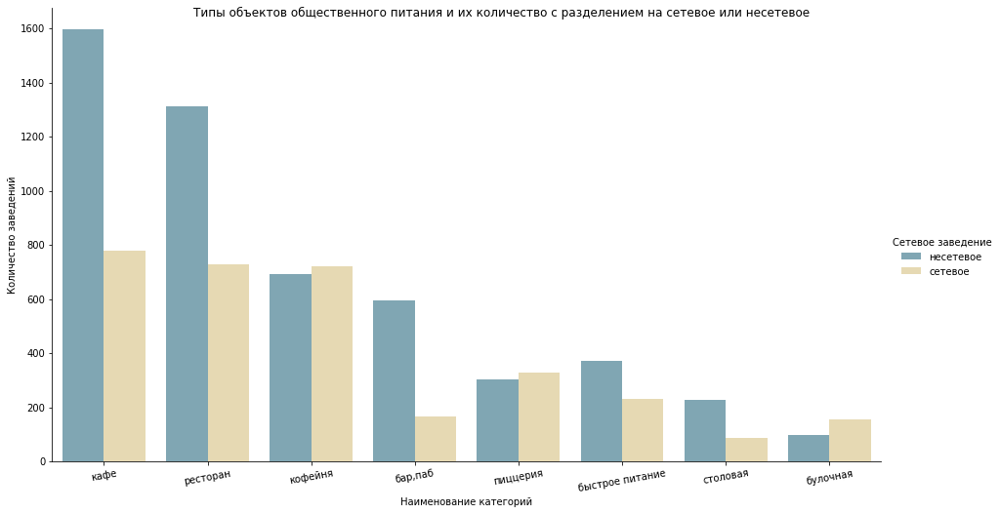

In [27]:
data01 = data
data01['chain'] = data['chain'].map({0:'несетевое', 1:'сетевое'})
ax = sns.catplot(x='category', kind='count', orient="v",  palette="blend:#7AB,#EDA", height=7, data=data01, aspect=1.8,
                order=data['category'].value_counts().index, hue='chain', legend = False)
ax.set_axis_labels("Наименование категорий", "Количество заведений")
ax.set_xticklabels(rotation=10)
ax.add_legend(title='Сетевое заведение')
ax.fig.suptitle('Типы объектов общественного питания и их количество с разделением на сетевое или несетевое')
sns.despine()

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

На первый взгляд так и не скажешь, что несетевых объектов больше. 
    
Хорошо, что подтвердили это с помощью наших данных.
    
</div>

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Рекомендую также заменять легенду 0 и 1, на более осмысленные названия. Так как заказчику нужно будет дополнительно тогда объяснять что эти значения обозначают в нашем контексте.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Легенду заменила на "несетевое" и "сетевое" </div>

В разделении на сетевое/несетевое заведение, мы видим следующую картину:

- лидер заведений, кафе, в большей части не сетевые, как и рестораны; 

- кофейни чаще открывают сети, но не с большим отрывом от количества несетевых, можно даже скзать, что в равных долях, как и пиццерии;

Значит, открытие кафе или ресторана нашими инвесторами не в сетевом формате приемлемо.



In [28]:
# Посмотрим ТОП-15 популярных сетей в Москве. Сгруппируем данные по названиям заведений

chain1 = data[data['chain'] == "сетевое"]
top_15 =chain1.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.sort_values('district', ascending = False).reset_index().head(15)
top_15

,name,rating,category,district
0,шоколадница,4.20,кофейня,120
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,71
4,яндекс лавка,4.00,ресторан,69
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,39


В сетевых заведениях лидирует сеть Шоколадница. За ней в тройку входят Домино'c пицца и Додо пицца. Сказать, что лидируют сети пиццерий, мы не можем, так как из всех Топ-15 только эти две пиццерии и присутствуют. Так же в Топ-15 вошли: 5-кофейн, в тч и лидер, Шоколадница, 3 ресторана, 4 кафе, 1 булочная. 

Все сетевые заведения известны и у всех "на слуху": Шоколадница, Доминос'Пицца, Додо а=пицца, One Price, Яндекс Лавка, Cofix, Prime, Хинкальная, Кофепорт, Кулинарная лавка Братьев Караваевых, Теремок, Чайхана, Cofefest, Бухнка, Му-Му.

In [29]:
# Построим график топ-15 популярных сетей в Москве

fig = px.bar(top_15, x='name', y='district', text='district', color='name')
fig.update_layout(title = 'Топ-15 популярных сетей Москвы', xaxis_title = 'Количество заведений', yaxis_title = 'Название заведений', showlegend = False)
fig.show()

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

Также мы можем отобразить категории сразу на одном графике. Проще всего это сделать с помощью `plotly.express` на графике `bar`, в этой функции есть атрибут `color`. Если вдруг не получится разобраться, то напиши об этом я и постараюсь помочь в следующей итерации.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Извини, не поняла замечание. Нужно добавить в этот график категорию этих сетевых заведений? </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Да, это можно отобразить на одном графике предварительно сгруппировав данные по названию и категории.
    
    
</div>

В шаге предабработки данных мы уже просмативали количество заведений по округам и знаем, что с преимущественным отрывом, 2242 заведения находятся в Центральном Административном округе. Далее следуют Северный и Южный административыне округи, 898 и 892 заведений соответственно. И почти без отрыва от них, Северо-Восточный административный округ (890 заведений). Всего представлено 9 округов. Западный административный округ - 850 заведений, Восточный административный округ - 798, Юго-Восточный административный округ - 714, Юго-Западный административный округ-709, Северо-Западный административный округ - 409.

Преимущество Центрального Административного округа очевидно в силу туристического интереса и потока людей, насыщенности офисных бизнес-центров.В округе расположено много театров, 6 московских вокзалов — Белорусский, Ленинградский, Ярославский, Казанский, Курский, Павелецкий, большинство министерств Российской Федерации, а также Кремль, Правительство РФ, Государственная дума, Совет Федерации. Значительную часть территории округа занимают различные офисные здания, на западной окраине округа в том числе расположен ММДЦ «Москва-Сити».

Северный административный округ представляет собой 17 районов: Аэропорт, Беговой, Бескудниково, Бусиново, Войковский, Восточное Дегунино, Головинский, Дмитровский, Западное Дегунино, Коптево, Левобережный, Савеловский, Сокол, Тимирязевский, Ховрино, Хорошевский и Молжаниновский (расположен за пределами МКАД). В округ входят исторические местности: Всехсвятское, Михалково, Петровско-Разумовское, Коровино и др. Половина раайонов представляют собой элитные жилые кварталы. При этом в округе находятся железнодорожные пути Белорусского вокзала и Савеловского. Так же проходит линия большой обустроенной парковой зоны Северного речного порта.

В СВАО много благоустроенных парков, прудов, небольших рек. Округ делится на 17 районов:Алексеевский, Алтуфьевский,Бабушкинский, Бибирево, Бутырский, Лианозово, Лосиноостровский, Марфино, Марьина Роща, Останкинский, Отрадное, Ростокино, Свиблово, Северное Медведково, Северный, Южное Медведково, Ярославский. Помимо плотной жилой застройки, в округе обустроеная парковая линия Москвы-реки и ее канала.

Южный административный округ включает в себя 16 районов и является крупнейшим по населению округом города. Помимо большой застройки "спальных" районов, в округе находится большое количество достопримечательностей города: Царицинский парк, ансамбль историко-архитектурных памятников XVI—XIX веков "Донской монастырь", одно из древнейших мест Москвы — музей-заповедник «Коломенское»; историко-архитектурный ансамбль XVI—XVIII веков «Симонов монастырь».

В отличие от СВАО с его "роскошными" жилыми комплексами и бизнес-центрами, ЮАО сочетал в себе исторические обьекты и "спальные" районы.

Как видим, ЦАО главный претендент на успешное функционирование любого типа заведения. Но не станем оставлять без внимания и остальные округа из "тройки лидеров".

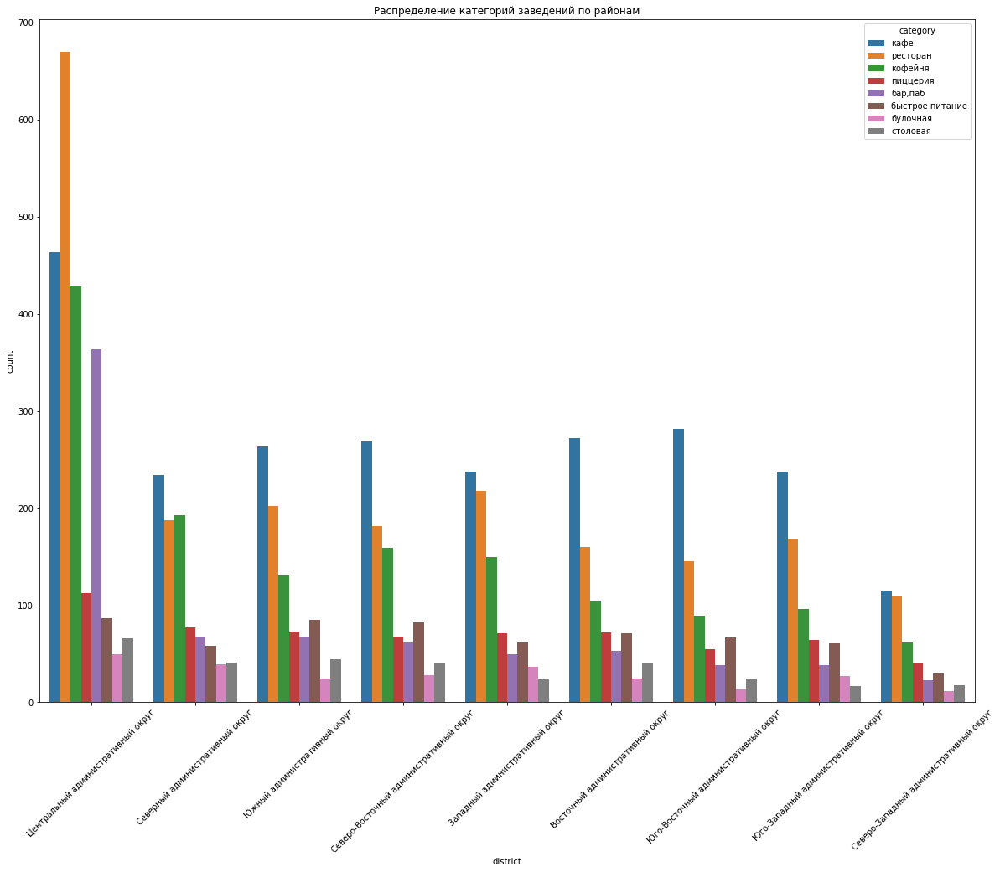

In [30]:
# Проанализируем, как разделяются заведение по административным районам 

plt.figure(figsize=(20, 15))
sns.countplot(x='district', hue='category', data=data, order = data['district'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Распределение категорий заведений по районам')
plt.show()

Кафе, как лидеры в разбивке категорий, остались лидирующим типом во всех округах, кроме ЦАО. Здесь лидируют рестораны. 

В общем, картина соответсвует данным, полученным ранее на этапе предобработки данных, за исключением наших "лидеров".

Раасмотрим подробно количество заведений каждой категории по районам (в цифрах) для наших "лидеров": ЦАО, САО, ЮАО

In [31]:
# Количество заведений по категориям в Центральном Административном Округе

tsao = data[data['district'] == 'Центральный административный округ']
tsao = tsao.groupby(['district', 'category'])['name'].count().reset_index()
chain.columns = ['district', 'categor', 'total']
tsao

,district,category,name
0,Центральный административный округ,"бар,паб",364
1,Центральный административный округ,булочная,50
2,Центральный административный округ,быстрое питание,87
3,Центральный административный округ,кафе,464
4,Центральный административный округ,кофейня,428
5,Центральный административный округ,пиццерия,113
6,Центральный административный округ,ресторан,670
7,Центральный административный округ,столовая,66


Наглядно, так сказать, на цифрах видим, что в ЦАО рестораны лидируют по количеству заведений. Кафе на втором месте, 464 заведения, и кофейни, 428 заведения, на третьем.

In [32]:
# Количество заведений по категориям в Северный Административный Округ

tsao = data[data['district'] == 'Северный административный округ']
tsao = tsao.groupby(['district', 'category'])['name'].count().reset_index()
chain.columns = ['district', 'categor', 'total']
tsao

,district,category,name
0,Северный административный округ,"бар,паб",68
1,Северный административный округ,булочная,39
2,Северный административный округ,быстрое питание,58
3,Северный административный округ,кафе,234
4,Северный административный округ,кофейня,193
5,Северный административный округ,пиццерия,77
6,Северный административный округ,ресторан,188
7,Северный административный округ,столовая,41


САО лидируют кафе (234 заведения), как и в общем случае по городу, а вот второе и третье место поменялись: кофейни на втором месте (193 заведения), а рестораны на 3-м (188 заведения)

In [33]:
# Количество заведений по категориям в Южный Административный Округ

tsao = data[data['district'] == 'Южный административный округ']
tsao = tsao.groupby(['district', 'category'])['name'].count().reset_index()
chain.columns = ['district', 'categor', 'total']
tsao

,district,category,name
0,Южный административный округ,"бар,паб",68
1,Южный административный округ,булочная,25
2,Южный административный округ,быстрое питание,85
3,Южный административный округ,кафе,264
4,Южный административный округ,кофейня,131
5,Южный административный округ,пиццерия,73
6,Южный административный округ,ресторан,202
7,Южный административный округ,столовая,44


ЮАО без исменений лидеров. Видим, что кафе 264 заведения, ресторанов - 202, а кофейн - 131 заведение.

In [34]:
# Рейтинги по категориям заведений

rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


У всех категорий заведений рейтинги выше среднего. Наивысший 4,39 у баров/пабов. За ними следуют пиццерии (4,30) и рестораны (4,29). Лидер разбивки по категориям, кафе, находится на предпоследнем месте со средним рейтингом 4,12.

In [35]:
fig = px.bar(rating, x='rating', y='category', text='rating')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4])
fig.show()

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Здесь мы можем скрыть легенду, т.к. она дублирует информацию из оси Y.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Исправлено </div>

In [36]:
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))



{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [37]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


У всех округов хороший рейтинг у заведений, выше 4. Самый высокий средний рейтинг у заведений ЦАО - 4.38, за ним следует САО - 4.24 и СЗАО 4.21. В московских заведениях отлично кормят/поят и обслуживают ;) 

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>

<s>Лучше всего импортировать все необходимые библиотеки в самом начале проекта. 
    
Это общепринятый формат в программировании, ведь так проще понять какие пакеты будут использованы в нашей работе.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Перенесла в начало </div>

In [38]:
# загружаем JSON-файл с границами округов Москвы
#state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Рад, что получилось визуализировать данные на карте, ведь так быстрее разобраться какая ситуация в каком округе в зависимости от показателя.   
</div>

На карта мы наглядно видим подтверждение наших исследований рейтинга заведений по округам.  

In [39]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# к каждой строке датафрейма применяем функцию
data.apply(create_cluster, axis=1)

# выводим карту
m

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Супер 👍, кластеры то что нужно, т.к. не сильно нагружают график из-за своей сгруппированности. Если убрать кластеры, то тетрадка будет работать тяжело из-за отображения буквально каждой точки на карте.
    
</div>

На карте г.Москва мы показали рейтинги всех заведений по округах и представили наглядно количество точек общепита.

Рассмотрим следующий вопрос из нашего исследования и определим, на каких улицах города находится самое большое количество заведений.

In [40]:
# ТОП-15 улиц по количеству заведений

streets15 = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)
streets15

street
проспект мира             183
профсоюзная улица         122
проспект вернадского      108
ленинский проспект        107
ленинградский проспект     95
дмитровское шоссе          88
каширское шоссе            77
варшавское шоссе           76
ленинградское шоссе        70
мкад                       65
люблинская улица           60
улица вавилова             55
кутузовский проспект       54
улица миклухо-маклая       49
пятницкая улица            48
Name: name, dtype: int64

"Победителем" в ТОП-15 улиц по количеству заведений стал проспект Мира - проспект на северо-востоке Москвы. Начинается от Сухаревской площади на Садовом кольце, являясь продолжением Сретенки. Заканчивается на Северянинском путепроводе, переходя в Ярославское шоссе. С 12 века - дорога на Ярославль. Не самая длинная улица города. Но насыщенная историческими объектами, памятниками архитектуры, учебными заведениями, государственными учреждениями, культурно-развлекательными учреждениями и проч.

На втором месте идет улица Профсоюзная с 122 заведениями.  Это улица в Юго-Западном административном округе города Москвы на территории районов Академический, Коньково, Обручевский, Тёплый Стан, Черёмушки, Ясенево. Она проходит по всем спальным районам ЮЗАО с парками и всем благоустройством кварталов. Этим и объясняется большое количество открытых заведений обещственного питания.

Проспект Вернадского и Ленинский проспект подчи не отличаюся по количеству открытых заведений, 108 и 107 соответственно. 

Самая длинная улица города, Варшавское шоссе, обосновалось на 8 месте ТОП-15, с 76 заведениями. Возможно, это объясняется большим наличием медицинских центров (больниц и мед НИИ), занимающих большие территории вдоль проспекта, так же промышленных зон и масштабными строительными рынками.

In [41]:
# # делаем новый датафрейм с топ улицами из списка

top15 = streets15.index.values.tolist()
data15 = data.query('street in @top15')

# группируем по улице и категории заведений и считаем количество заведений
streets15_category = data15.groupby(['street', 'category'])['name'].count().reset_index()
streets15_category

,street,category,name
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,18
3,варшавское шоссе,кофейня,14
4,варшавское шоссе,пиццерия,4
...,...,...,...
106,улица миклухо-маклая,быстрое питание,4
107,улица миклухо-маклая,кафе,21
108,улица миклухо-маклая,кофейня,4
109,улица миклухо-маклая,пиццерия,2


In [42]:
# Построим график распределения количества заведений и их категорий по ТОП-15 улицам города

fig = px.bar(streets15_category.sort_values(by='name', ascending=False),
             x='street',
             y='name',
             color='category',
             text = 'name',
             color_discrete_sequence=px.colors.qualitative.G10)
fig.update_layout(title='Распределения количества заведений и их категорий по ТОП-15 улицам города',
                  xaxis_title='УЛИЦЫ',
                  yaxis_title='ЗАВЕДЕНИЯ',
                  width=1020,
                  height=600)
fig.show()

<div class="alert alert-warning">
<b>Комментарий ревьюера: ✅</b>
    
<s>Вопрос со **"звездочкой"** 😊:

Как ты считаешь это тот самый топ который нам нужен ? 
    
То есть возможно это улицы такие большие и поэтому в них большое количестов объектов питания ? 
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Это я проверила, перед тем, как писать промежуточный вывод. Самые длинные улицы Москвы: Варшавское шоссе (про него я потом и "сумничала" в выводе), Ленинградский проспект и Ленинский проспект (может длинна наоборот у них, но эта "троица" точно самые протяженные в городе). Поэтому Мира, Профсоюзная и Вернадского точо подходят для тоговых выводов </div>

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Это больше дискуссионный вопрос конечно же 😊 Из интересных идей, что можно было бы добавить например – посчитать плотность заведений на 1 км. и далее ранжировать по этому показателю, но для этого требуются дополнительные данные. Однако уверен, что после того как найдем новые данные, это все выйдет в новое исследование 😊
    
    
</div>

По категориям заведений на улицах ТОП-15, мы видим следующую картину (опишем тройку лидеров):

- на проспекте Мира заведения расположились в следующем порядке (по убыванию): кафе - 53 заведения, рестораны - 45, кофейни - 36, быстрого питания - 21, бар/паб - 11, как и пиццерий, булочных - 4 и 2 столовых;

- на Профсоюзной улице: 35 кафе, 26 ресторанов, 18 кофейн, по 15 заведений быстрого питания и пиццерий, 9 баров/пабов, 4 булочных и 3 столовых; 

- на проспекте Вернадского: 33 ресторана, 26 кафе, 23 кофейни, 10 баров, по 5 пиццерий и столовых, 3 булочных и 2 завдения быстрого питания.

Данная информация нам точно показывает, что булочные и столовые мало восстребованы в г.Москве, в то время, как в г.Санкт-Петербурге такой формат на каждом углу домов. 

In [43]:
# Улицы с 1 объектом общепита

category1 = data['street'].value_counts().reset_index()
category1.columns = ['street', 'count_cafe']
category1 = category1[category1['count_cafe']==1]
category1

,street,count_cafe
990,улица демьяна бедного,1
991,малая красносельская улица,1
992,выползов переулок,1
993,1-я ямская улица,1
994,москворецкая набережная,1
...,...,...
1442,улица буженинова,1
1443,красноармейская улица,1
1444,сумской проезд,1
1445,шоссейный проезд,1


Всего у нас 457 улиц, на которых располагаются только 1 заведение общепита. 

<div class="alert alert-warning">
<b>Комментарий ревьюера: ❗️</b>


Можно было также визуализировать эту информацию например по категориям. Ведь на графике информацию воспринимать гораздо легче, чем просто в таблице.
    
    
</div>

In [44]:
# Определим к какому типу относятся заведения, котрые в единичном порядке находняся на вышеуказанных улицах

streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category_1 = streets_category[streets_category['street'].isin(category1['street'])]
streets_category_1 = streets_category_1.groupby('category')['street'].count().sort_values(ascending=False).reset_index()
streets_category_1.columns = ['category', 'total']
streets_category_1

,category,total
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


По одному кафе находится в 159 случаях, 93 ресторана, 84 кофейни, 39 пабов, 36 столовых, 23 заведений быстрого питания, 15 пиццерий и 8 булочных.

In [45]:
# Посчитаем медианное значение среднего чека для каждого округа

median_avg_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Одними из высоких средних чеков в 1000р может похватсаться два округа: Западный и Центральный. На втором месте дороговизны идет СЗАО со средней стоимости чека в 700р. Тройку замыкает САО со средним чеком в 650р. Бюджетнее всего можно найти заведения в ЮВАО, здесь средний чек составит 450р.

Построим фоновую картограмму с полученными значениями для каждого района. 

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
median_avgbill_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение чека для каждого района',
).add_to(median_avgbill_map)

# выводим карту
median_avgbill_map

На карта мы наглядно видим подтверждение наших исследований значений средних чеков по округам.  

# ВЫВОДЫ ИССЛЕДОВАНИЯ

Нами было проделано исследование заведений общественного питания г.Москва для раскрытия вопроса открытия нового.

В ходе исследования мы установили следующие моменты:

1. Большая часть заведений (2376) представляют собой кафе 28,27%. На втором месте по количеству идут рестораны (2042 заведения) и тройку "лидеров" завершают кофейни, 1413 заведений. "Лидеры" заняли 5831 заведение, что более половины от всех предоставленных нам заведений (69,37%). Оставшиеся 2575 заведений разденены на 5 категорий с существенно меньшим количеством в каждой: паб/бар 764 заведения, пиццерии - 633, быстрое питание - 603, столовых - 315, булочных - 256.

Исследования мы визуализировали и представили на графике "Количество заведений общественного питания по категориям".

Эта информация нам дает повод для размышлений: совершать нам инвестирование в "тройку" категорий, как восстребованных, ибо спрос рождает предложения, либо рассматривать варианты остальных категорий, как свободное и не перенасыщенное предложениями пространство для бизнеса.

2. Исследовали количество посадочных мест в заведениях по категориям. Средняя величина показывает нам градацию в следующем порядке: 124 гостя могут принять одновременно бары/пабы, далее идут рестораны - 122 клиента в среднем, кофейни - 111, столовые - 100, заведения быстрого питания - 99, кафе - 97, пиццерии - 94, булочные - 89.

Так как ресторанов, кафе и кофейн открыто больше в городе, поэтому по общему количеству посадочных мест по категориям во всем городе мы получили иное: самое большое количество посадочных мест у ресторанов - 154681 клиентов на весь город, что состваляет 29.79%. С небольшим отрывом следуют кафе 118494 клиента (22.82%). А замыкают тройку лидеров кофейни 83511 гостя (16.08%). Далее идут бары -  58131 (11.19%), пиццерии - 40350 (7.77%), заведения быстрого питания - 34313 (6.65%), столовых - 16359 (3.15%), булочные -2.55%.

Рестораны, конечно же, открывают с перспективой для больших торжеств и большего количества гостей одновременно, поэтому они и сместили "лидерство" кафе с максимальным количеством заведений в этой группировке. 

Исследования мы визуализировали и представили на графике "Количество посадочных мест по категориям". 

3. Рассмотрели количество сетевых и несетевых заведений. Из всего общего количества представленных нам заведений, большая часть (5199 заведений) принадлежит к несетевым, а 3203 заведения сетевые.

Исследования мы визуализировали и представили на графике "Типы объектов общественного питания и их количество с разделением на сетевое или несетевое".

4. В разделении на сетевое/несетевое заведение, мы увидели следующую картину:

- лидер заведений, кафе, в большей части не сетевые, как и рестораны; 

- кофейни чаще открывают сети, но не с большим отрывом от количества несетевых, можно даже скзать, что в равных долях, как и пиццерии;

Значит, открытие кафе или ресторана нашими инвесторами не в сетевом формате приемлемо.


5. В сетевых заведениях лидирует сеть Шоколадница. За ней в тройку входят Домино'c пицца и Додо пицца. Сказать, что лидируют сети пиццерий, мы не можем, так как из всех Топ-15 только эти две пиццерии и присутствуют. Так же в Топ-15 вошли: 5-кофейн, в тч и лидер, Шоколадница, 3 ресторана, 4 кафе, 1 булочная. Все сетевые заведения известны и у всех "на слуху": Шоколадница, Доминос'Пицца, Додо а=пицца, One Price, Яндекс Лавка, Cofix, Prime, Хинкальная, Кофепорт, Кулинарная лавка Братьев Караваевых, Теремок, Чайхана, Cofefest, Бухнка, Му-Му.

Исследования мы визуализировали и представили на графике "Топ-15 популярных сетей Москвы".

6. Всего у нас в файле было представлено 9 округов: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ.

Больше всего, 2242 заведений, находятся в Центральном Административном округе. Далее следуют Северный и Южный административыне округи, 898 и 892 заведений соответственно. И почти без отрыва от них, Северо-Восточный административный округ (890 заведений). Всего представлено 9 округов. Западный административный округ - 850 заведений, Восточный административный округ - 798, Юго-Восточный административный округ - 714, Юго-Западный административный округ-709, Северо-Западный административный округ - 409.

Преимущество Центрального Административного округа очевидно в силу туристического интереса и потока людей, насыщенности офисных бизнес-центров.В округе расположено много театров, 6 московских вокзалов — Белорусский, Ленинградский, Ярославский, Казанский, Курский, Павелецкий, большинство министерств Российской Федерации, а также Кремль, Правительство РФ, Государственная дума, Совет Федерации. Значительную часть территории округа занимают различные офисные здания, на западной окраине округа в том числе расположен ММДЦ «Москва-Сити».

Северный административный округ представляет собой 17 районов: Аэропорт, Беговой, Бескудниково, Бусиново, Войковский, Восточное Дегунино, Головинский, Дмитровский, Западное Дегунино, Коптево, Левобережный, Савеловский, Сокол, Тимирязевский, Ховрино, Хорошевский и Молжаниновский (расположен за пределами МКАД). В округ входят исторические местности: Всехсвятское, Михалково, Петровско-Разумовское, Коровино и др. Половина раайонов представляют собой элитные жилые кварталы. При этом в округе находятся железнодорожные пути Белорусского вокзала и Савеловского. Так же проходит линия большой обустроенной парковой зоны Северного речного порта.

В СВАО много благоустроенных парков, прудов, небольших рек. Округ делится на 17 районов:Алексеевский, Алтуфьевский,Бабушкинский, Бибирево, Бутырский, Лианозово, Лосиноостровский, Марфино, Марьина Роща, Останкинский, Отрадное, Ростокино, Свиблово, Северное Медведково, Северный, Южное Медведково, Ярославский. Помимо плотной жилой застройки, в округе обустроеная парковая линия Москвы-реки и ее канала.

Южный административный округ включает в себя 16 районов и является крупнейшим по населению округом города. Помимо большой застройки "спальных" районов, в округе находится большое количество достопримечательностей города: Царицинский парк, ансамбль историко-архитектурных памятников XVI—XIX веков "Донской монастырь", одно из древнейших мест Москвы — музей-заповедник «Коломенское»; историко-архитектурный ансамбль XVI—XVIII веков «Симонов монастырь».

В отличие от СВАО с его "роскошными" жилыми комплексами и бизнес-центрами, ЮАО сочетал в себе исторические обьекты и "спальные" районы.

Как видим, ЦАО главный претендент на успешное функционирование любого типа заведения. Но не станем оставлять без внимания и остальные округа из "тройки лидеров".

Исследования мы визуализировали и представили на графике "Распределение категорий заведений по районам".

7. Рассмотрели рейтинги заведений города. У всех категорий заведений рейтинги выше среднего. Наивысший 4,39 у баров/пабов. За ними следуют пиццерии (4,30) и рестораны (4,29). Лидер разбивки по категориям, кафе, находится на предпоследнем месте со средним рейтингом 4,12. 

Исследования мы визуализировали и представили на графике "Распределение средних рейтингов по категориям заведений".

8. Построили фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

9. Отобразили все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

10. Нашли топ-15 улиц по количеству заведений. "Победителем" в ТОП-15 улиц по количеству заведений стал проспект Мира - проспект на северо-востоке Москвы. Начинается от Сухаревской площади на Садовом кольце, являясь продолжением Сретенки. Заканчивается на Северянинском путепроводе, переходя в Ярославское шоссе. С 12 века - дорога на Ярославль. Не самая длинная улица города. Но насыщенная историческими объектами, памятниками архитектуры, учебными заведениями, государственными учреждениями, культурно-развлекательными учреждениями и проч.

На втором месте идет улица Профсоюзная с 122 заведениями.  Это улица в Юго-Западном административном округе города Москвы на территории районов Академический, Коньково, Обручевский, Тёплый Стан, Черёмушки, Ясенево. Она проходит по всем спальным районам ЮЗАО с парками и всем благоустройством кварталов. Этим и объясняется большое количество открытых заведений обещственного питания.

Проспект Вернадского и Ленинский проспект подчи не отличаюся по количеству открытых заведений, 108 и 107 соответственно. 

Самая длинная улица города, Варшавское шоссе, обосновалось на 8 месте ТОП-15, с 76 заведениями. Возможно, это объясняется большим наличием медицинских центров (больниц и мед НИИ), занимающих большие территории вдоль проспекта, так же промышленных зон и масштабными строительными рынками.

Исследования мы визуализировали и представили на графике "Распределения количества заведений и их категорий по ТОП-15 улицам города".

По категориям заведений на улицах ТОП-3, мы видим следующую картину:

- на проспекте Мира заведения расположились в следующем порядке (по убыванию): кафе - 53 заведения, рестораны - 45, кофейни - 36, быстрого питания - 21, бар/паб - 11, как и пиццерий, булочных - 4 и 2 столовых;

- на Профсоюзной улице: 35 кафе, 26 ресторанов, 18 кофейн, по 15 заведений быстрого питания и пиццерий, 9 баров/пабов, 4 булочных и 3 столовых; 

- на проспекте Вернадского: 33 ресторана, 26 кафе, 23 кофейни, 10 баров, по 5 пиццерий и столовых, 3 булочных и 2 завдения быстрого питания.

Данная информация нам точно показывает, что булочные и столовые мало восстребованы в г.Москве, в то время, как в г.Санкт-Петербурге такой формат на каждом углу домов. 

11. Нашли улицы, на которых находится только один объект общепита. Всего у нас таких 457 улиц. По одному кафе находится в 159 случаях, 93 ресторана, 84 кофейни, 39 пабов, 36 столовых, 23 заведений быстрого питания, 15 пиццерий и 8 булочных. 

12. Посчитали медиану для средних чеков для каждого района. Одними из высоких средних чеков в 1000р может похватсаться два округа: Западный и Центральный. На втором месте дороговизны идет СЗАО со средней стоимости чека в 700р. Тройку замыкает САО со средним чеком в 650р. Бюджетнее всего можно найти заведения в ЮВАО, здесь средний чек составит 450р.

Построили фоновую картограмму с полученными значениями средних чеков для каждого района.



<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>
    
Хочется отметить, что на протяжении всего проекта чувствуется глубизна проработки задачи, что в свою очередь говорит о серьезном подходе к выполнению всего проекта в целом. А это не может не радовать в нашем деле, так держать! 😊👍
    
</div>

# Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

Есть ли круглосуточные кофейни?

Какие у кофеен рейтинги? Как они распределяются по районам?

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [ ]:
# Посчитаем количество кофейн

coffee = data[data['category'] == 'кофейня']
print('Количество кофейн в г.Москва:', len(coffee))

In [ ]:
# Найдем количество кофейн по округам

plt.figure(figsize=(20, 10))
sns.countplot(x='district', data=coffee, order = coffee['district'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Распределение кофейн по округам')
plt.show()

<div class="alert alert-danger">
<b>Комментарий ревьюера: ❌</b>

<s>Важно отсортировать подобные графики по возрастанию / убыванию во всем проекте. Так пользователю будет легче изучать информацию.
    
Давай поправим эти моменты.
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Исправлено замечание. В графики countplot добавлен order</div> 

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

Чтобы подписать значения на графике в других библиотеках, мы можем использовать следующие примеры ниже: 
    
- в библиотеке `matplotlib` <a href="https://queirozf.com/entries/add-labels-and-text-to-matplotlib-plots-annotation-examples">первый пример</a>, <a href="https://matplotlib.org/stable/gallery/lines_bars_and_markers/barchart.html">второй пример</a> для группированных графиков
    
- в библиотеке `seaborn` [тут](https://stackoverflow.com/questions/43214978/how-to-display-custom-values-on-a-bar-plot) и [тут](https://www.statology.org/seaborn-barplot-show-values/)
    
</div>

Больше всего кофейн расположено в ЦАО, САО и СВАО. Рассмотрим на карте города особенности их расположения.

In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

In [ ]:
# Посмотрим количество круглосуточных кофейн

print("Количество круглосуточных кофейн:", coffee['is_24/7'].sum())

In [ ]:
# Посмотрим рейтинги кофейн по районам

coffee_rating = coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating



Рейтинги у всех кофейн выше 4 баллов. Самые высокие у ЦАО - 4.34, СЗАО пркатически не уступает, в нем средний рейтинг кофейн 4,33. САО, ВАО, ЮЗАО следуют за лидерами, 4.29, 4.28, 4.28 соотвественно. В ЮВАО и ЮАО у кофейн средний рейтинг 4.23. В СВАО 4.22 и замыкает таблицу ЗАО со средним рейтингом у кофейн 4.20.

In [ ]:
# Средняя стоимость чашки капучино

cup_mean = coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_mean)
coffee_price = round(cup_mean['middle_coffee_cup'].mean())
print('Средняя стоимость чашки капуччино в г.Москва:', coffee_price)

Кофейни в городе не занимают лидирующие позиции по количеству заедений или посадочных мест, следовательньно, это не перенасыщенный сегмент в общественного питания. Идея открытия - более чем приемлема.

Лучшими округами для открытия успешного заведения стали бы ЦАО, САО и СВАО. А расположение вдоль обустроенной линии Москвы-реки и городского парка еще больше добавили бы шансов на успешное процветание заведения.

Так как вышеуказанные округа презентабельные и с отличной проходимостью посетителей, то стоимость за чашку капуччино можно устанавливать на момент окрытия в размере средней по городу стоимсоти в 170рублей. Это привлечет посетителей и ниже, чем у конкурентов на данный момент. Впоследствии стоимость можно и сравнять со срейдней по округу или даже поднять выше, но это по достижению высокого рейтинга и признания уникальности посетителями.

Презентация: <https://github.com/OlesyaSergeevnaBondarenko/Practicum/tree/main/%D0%9F%D1%80%D0%B5%D0%B7%D0%B5%D0%BD%D1%82%D0%B0%D1%86%D0%B8%D1%8F>

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>

В целом работа очень хорошая. Использовано достаточно большое количество информации, которое складывается в одну общую картинку.
    
На самом деле, там где мы используем повторяющиеся действия по построениям графиков, то есть однотипные графики, рекомендую создавать функции, чтобы не писать один и тот же код несколько раз. Тем самым сможем автоматизировать и оптимизировать свой проект.
    
---
    
    
Презентация сделана хорошо, особенно порадовало:
    
- её структурность
- последовательность

    
Как её можно было бы ещё улучшить:
    
- добавить графики
- сформировать summary в самом начале презентации, все любят видеть результат сразу 😊
- добавить цель самого исследования на втором слайде
- пронумеровать слайды
- сделать оглавление
- где графики на презентации сделать тезисные выводы (1, 2, 3 не более)
    
Давай поправим эти важные моменты.
    

</div>

<div class="alert alert-success">
<b>Комментарий ревьюера: ✅</b>
    

Возвращаю проект обратно, чтобы убедиться что все мои комментарии понятны.
    
Если вдруг у тебя возникнут какие-то вопросы, то я с радостью отвечу на них 😊
    
</div>

<div class="alert alert-info"> <b>Комментарий студента: </b> Замечания учтены и внесены исправления. Презентация исправлена, ссылка обновлена </div> 

<div class="alert alert-success">
<b>Комментарий ревьюера (2): ✅</b>

Рад, что в целом все понятно и особенно здорово, что сразу стараешься применить новые знания на практике, ведь так они усвоятся гораздо быстрее. Тогда предлагаю двигаться дальше.
    
Поздравляю с успешным завершением проекта 😊👍
    
И желаю успехов в новых работах 😊
    
    
</div>